In [1]:
from nltk.sentiment import SentimentIntensityAnalyzer
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
sia = SentimentIntensityAnalyzer()

In [2]:
import nltk
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /home/subha/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

## Train and Test Data

In [3]:
import pandas as pd
X_test_ = pd.read_parquet('/home/subha/aiwork/project/output/cleandata/test_data_sample/', engine='pyarrow' )
X_train_ = pd.read_parquet('/home/subha/aiwork/project/output/cleandata/train_data_sample/', engine='pyarrow' )
X_val_ = pd.read_parquet('/home/subha/aiwork/project/output/cleandata/val_data_sample/', engine='pyarrow' )

## Polarity Score

In [4]:
def polarity_score(df):
    # Run the polarity score on the entire dataset
    res = {}
    for i, row in tqdm(df.iterrows()):
        text = row['cleaned_text']
        myid = i
        res[myid] = sia.polarity_scores(text)
    vaders = pd.DataFrame(res).T
    vaders = vaders.join(df, how='left')
    return vaders

In [5]:
X_train_pol = polarity_score(X_train_)

0it [00:00, ?it/s]

In [6]:
X_test_pol = polarity_score(X_test_)

0it [00:00, ?it/s]

In [7]:
X_val_pol = polarity_score(X_val_)

0it [00:00, ?it/s]

In [8]:
X_test_pol

,neg,neu,pos,compound,cleaned_text,sentiment
0,0.036,0.882,0.083,0.3438,adequate performance i just pulled batteries f...,0
1,0.000,1.000,0.000,0.0000,after less than mos i started seeing a lot of ...,0
2,0.000,0.906,0.094,0.3612,after using two sets of these i am going to ag...,0
3,0.224,0.626,0.150,-0.6478,amazon brand batteries are very poor quality d...,0
4,0.099,0.862,0.039,-0.2732,as expected from amazon there were no problems...,0
...,...,...,...,...,...,...
5617,0.000,0.763,0.237,0.7351,got this for wife for christmas she loves thin...,1
5618,0.000,0.483,0.517,0.8934,great for beginner or experienced person bough...,1
5619,0.000,0.590,0.410,0.9099,this product is really awesome for kids to pla...,1
5620,0.000,0.724,0.276,0.9418,this tablet is awesome the fact that i can use...,1


## WordCloud

In [9]:
from wordcloud import WordCloud
def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color='black',
        max_words=200,
        max_font_size=40,
        scale=1,
        random_state=1
).generate(" ".join(data))

    fig = plt.figure(1, figsize=(15, 15))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize=20)
        fig.subplots_adjust(top=2.3)

    plt.imshow(wordcloud)
    plt.show()

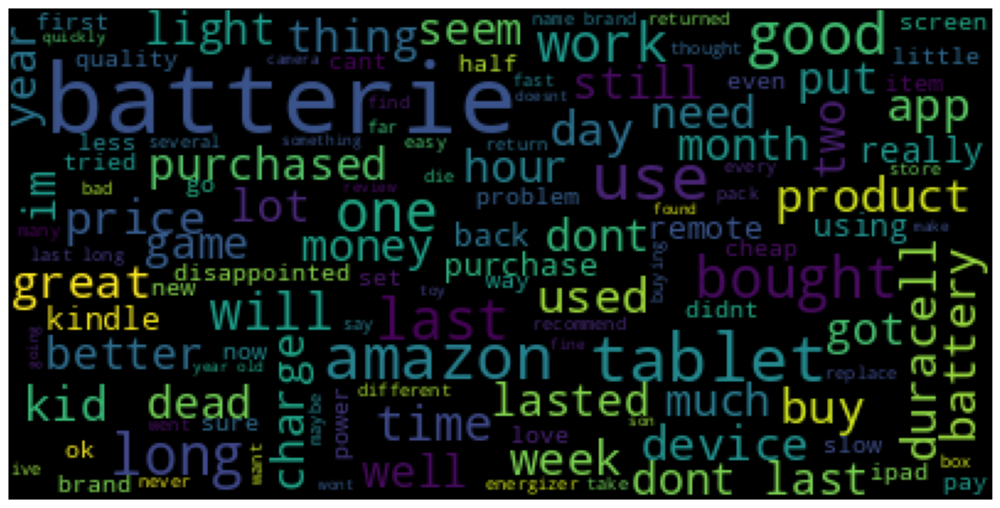

In [10]:
show_wordcloud(X_train_[X_train_['sentiment'] == 0]["cleaned_text"].values)

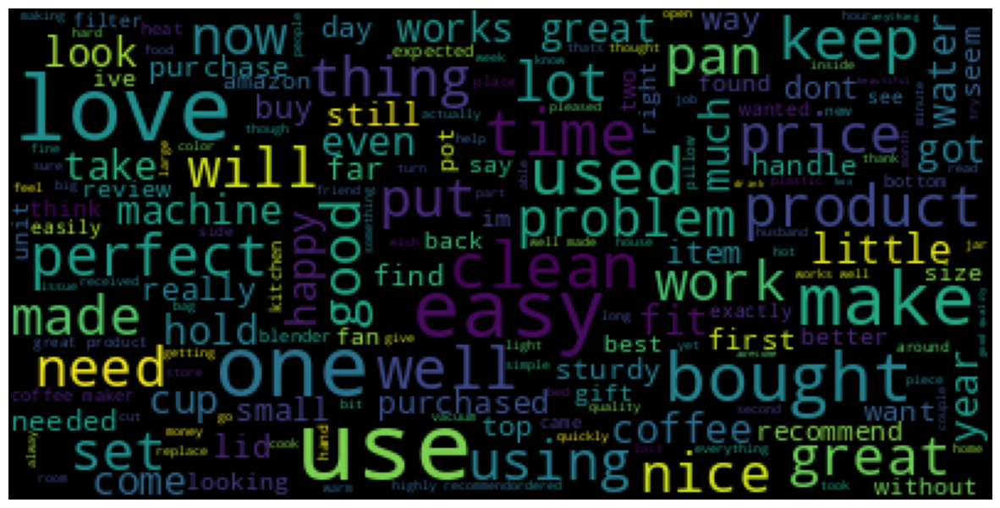

In [13]:
show_wordcloud(X_train_[X_train_['sentiment'] == 1]["cleaned_text"].values)

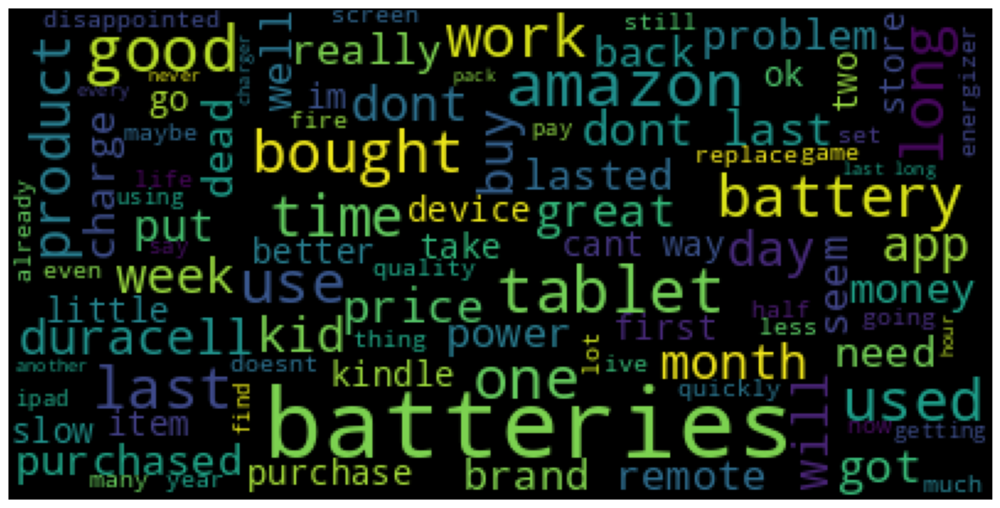

In [11]:
show_wordcloud(X_val_[X_val_['sentiment'] == 0]["cleaned_text"].values)

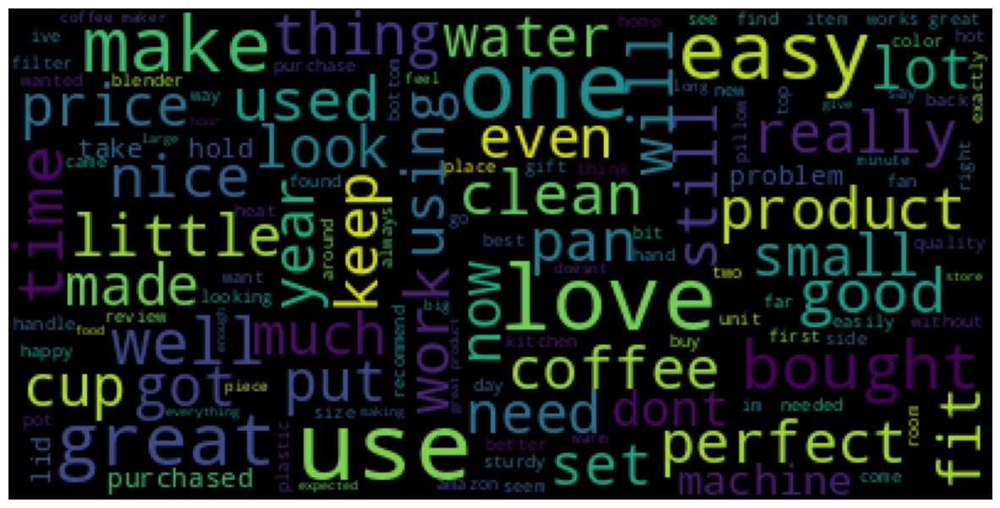

In [15]:
show_wordcloud(X_val_[X_val_['sentiment'] == 1]["cleaned_text"].values)

## Word Frequency

In [12]:
from collections import Counter, defaultdict
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
stopWords_nltk = set(stopwords.words('english'))
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from plotly.offline import plot

texts = X_val_[X_val_['sentiment'] == 1]["cleaned_text"]
new = texts.str.split()
new = new.values.tolist()
corpus = [word for i in new for word in i]
counter = Counter(corpus)
most = counter.most_common()
x, y = [], []
for word, count in most[:100]:
    if word not in stopWords_nltk:
        x.append(word)
        y.append(count)

fig = go.Figure(go.Bar(
            x=y,
            y=x,
            orientation='h',  marker=dict(
        color='rgba(50, 171, 96, 0.6)',
        line=dict(
            color='rgba(50, 171, 96, 1.0)',
            width=1),
    ),
    name='Most common Word',))

fig.update_layout( title={
        'text': "Most Common Words Positive Reviews",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'}, font=dict(
        family="Courier New, monospace",
        size=18,
        color="RebeccaPurple"
    ))

fig.show()

[nltk_data] Downloading package stopwords to /home/subha/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
texts = X_val_[X_val_['sentiment'] == 0]["cleaned_text"]
new = texts.str.split()
new = new.values.tolist()
corpus = [word for i in new for word in i]
counter = Counter(corpus)
most = counter.most_common()
x, y = [], []
for word, count in most[:100]:
    if word not in stopWords_nltk:
        x.append(word)
        y.append(count)

fig = go.Figure(go.Bar(
            x=y,
            y=x,
            orientation='h',  marker=dict(
        color='rgba(50, 171, 96, 0.6)',
        line=dict(
            color='rgba(50, 171, 96, 1.0)',
            width=1),
    ),
    name='Most common Word',))

fig.update_layout( title={
        'text': "Most Common Words Negative Reviews",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'}, font=dict(
        family="Courier New, monospace",
        size=18,
        color="RebeccaPurple"
    ))

fig.show() 